In [ ]:
#!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [1]:
import pandas as pd
import folium 
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

from pandas_profiling import ProfileReport

In [3]:
url = 'https://raw.githubusercontent.com/leilaff89/house_sales_prediction/main/datasets/house_prices_no_null.csv'

In [4]:
df = pd.read_csv(url)

#### Map of Perth

In [ ]:
coord = [-31.95224,115.8614]
map = folium.Map(coord, zoom_start=10)
for i in range(3000):
  circle = folium.Circle((df.iloc[i,13], df.iloc[i,14]), 
                         radius=300, 
                         color='#d35400', 
                         fill=True
                         ).add_child(folium.Popup((df.iloc[i,0])))
  map.add_child(circle)

map

#### No outliers on price!

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


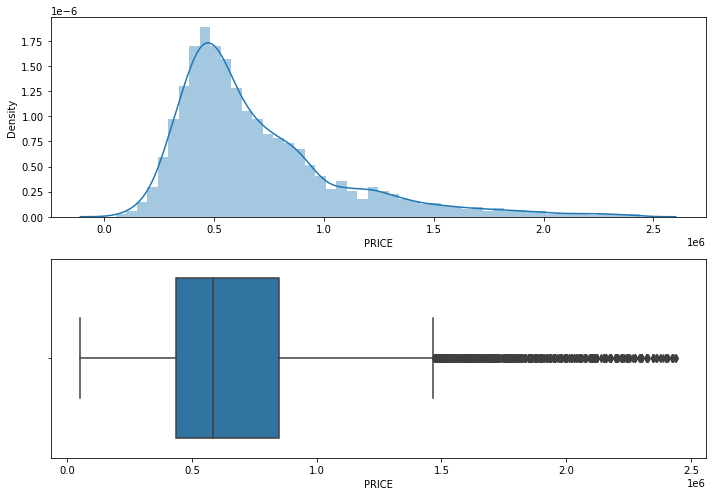

In [9]:
#house prices
fig = plt.figure(figsize=(10,7))
fig.add_subplot(2,1,1)
sns.distplot(df['PRICE'])
fig.add_subplot(2,1,2)
sns.boxplot(df['PRICE'])
plt.tight_layout()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


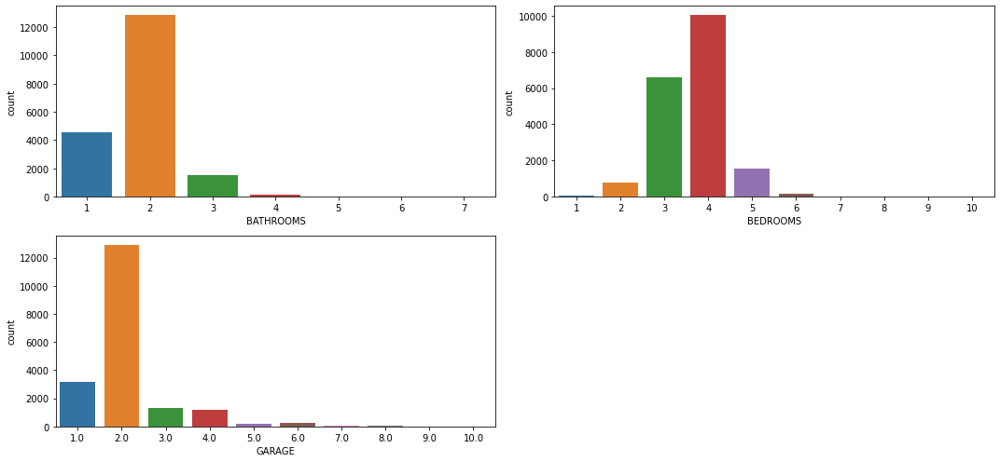

In [10]:
#bathrooms, bedrooms, garage
fig = plt.figure(figsize=(15,7))
fig.add_subplot(2,2,1)
sns.countplot(df['BATHROOMS'])
fig.add_subplot(2,2,2)
sns.countplot(df['BEDROOMS'])
fig.add_subplot(2,2,3)
sns.countplot(df['GARAGE'])
plt.tight_layout()

#### Areas might not be decisive to determine the price.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


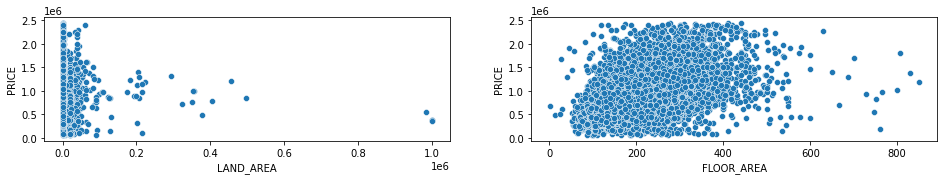

In [11]:
#house areas x price
fig = plt.figure(figsize=(16,5))
fig.add_subplot(2,2,1)
sns.scatterplot(df['LAND_AREA'], df['PRICE'])
fig.add_subplot(2,2,2)
sns.scatterplot(df['FLOOR_AREA'], df['PRICE'])

#### With a bigger distance, the price tends to decrease.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


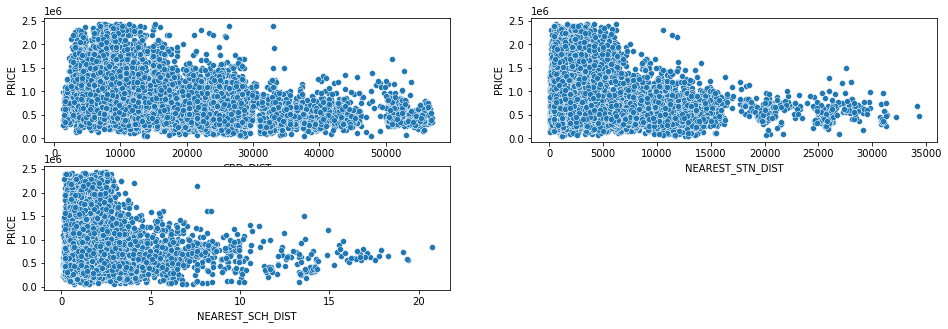

In [12]:
#distances x price
fig = plt.figure(figsize=(16,5))
fig.add_subplot(2,2,1)
sns.scatterplot(df['CBD_DIST'], df['PRICE'])
fig.add_subplot(2,2,2)
sns.scatterplot(df['NEAREST_STN_DIST'], df['PRICE'])
fig.add_subplot(2,2,3)
sns.scatterplot(df['NEAREST_SCH_DIST'], df['PRICE'])

#### The houses tends to be solded by a higher price in the australian summer. The prices had a big increase after the year 2000.

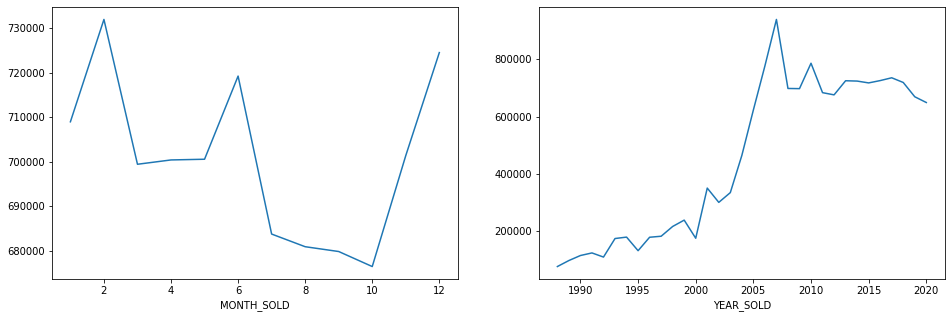

In [13]:
#dates x price
fig = plt.figure(figsize=(16,5))
fig.add_subplot(1,2,1)
df.groupby('MONTH_SOLD').mean()['PRICE'].plot()
fig.add_subplot(1,2,2)
df.groupby('YEAR_SOLD').mean()['PRICE'].plot()

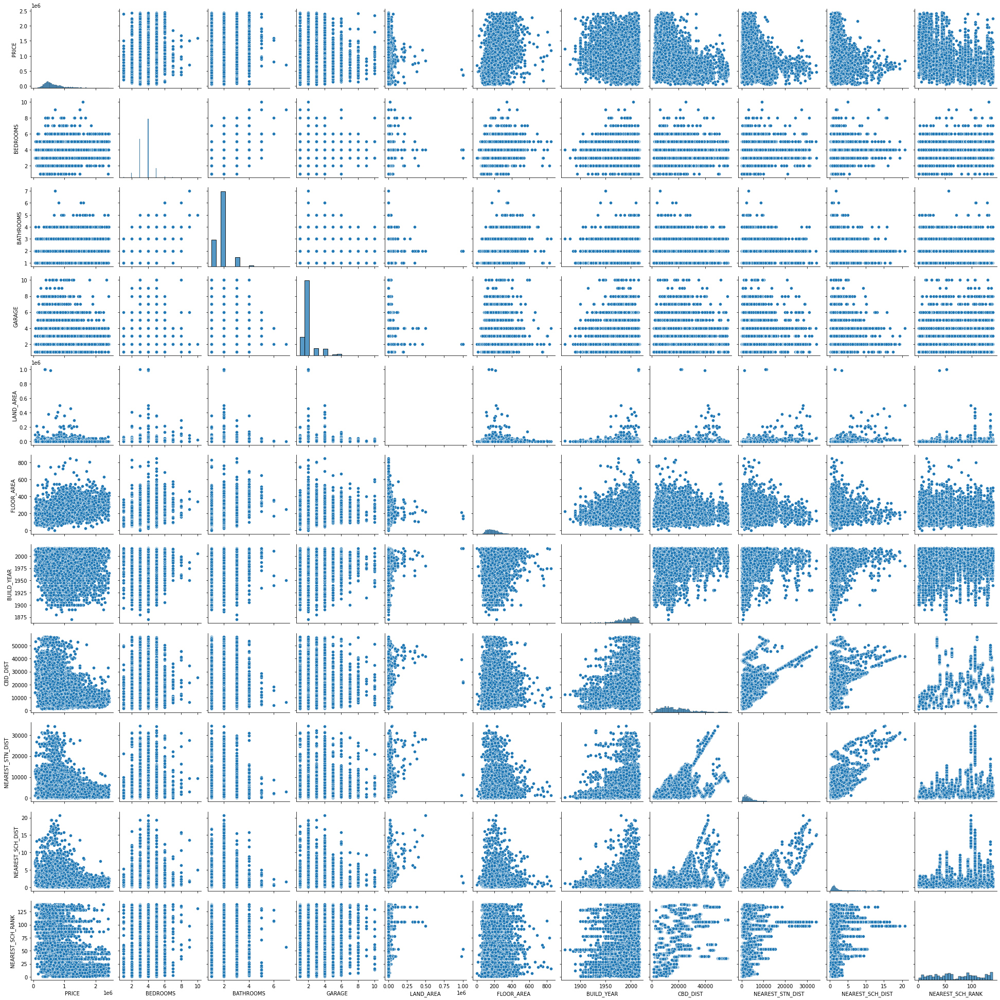

In [16]:
#other general correlation visualizations
df_vis = df[['PRICE','BEDROOMS','BATHROOMS','GARAGE','LAND_AREA','FLOOR_AREA','BUILD_YEAR','CBD_DIST','NEAREST_STN_DIST','NEAREST_SCH_DIST','NEAREST_SCH_RANK']]
sns.pairplot(df_vis)

#### Profiling Report

In [15]:
profile = ProfileReport(df, title='Profiling Perth Houses',html={'style':{'full_width':True}})
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]